# **Damilola Oyebade**
***
### <font color= Navy Blue> **Student ID: 202122960** </font>
**771763 - Understanding Artificial Intelligence**
***
### <span style="color:navy">**Component 2 — Multi-Object Recogniser:**</span>

### **1.0 Package installation**

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf
import cv2

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import pathlib

#from google.colab import drive 
#drive.mount('/content/gdrive')

#data_dir = "gdrive/My Drive/flower_photos"
data_dir = "./vehicles_images"
test_dir = "./test_vehicle"

### **2.0 Parameters definition**

In [2]:
batch_size = 32
img_height = 160
img_width = 160

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

class_names = train_ds.class_names
print(class_names)

Found 4318 files belonging to 4 classes.
Using 3455 files for training.
Found 4318 files belonging to 4 classes.
Using 863 files for validation.
['bus', 'motorcycle', 'plane', 'train']


### **3.0 Autotunning**

In [3]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
#test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)

normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixels values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

num_classes = 4

0.0 1.0


### **4.0 Modelling**
#### **4.1 Model definition**

In [4]:
model = Sequential([
    layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
    
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(pool_size=(2, 2), padding='same'),    
    layers.BatchNormalization(),
    
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(pool_size=(2, 2), padding='same'),    
    layers.BatchNormalization(),
    
    layers.Conv2D(64, 3, padding='same', activation='relu'),  
    layers.MaxPooling2D(pool_size=(2, 2), padding='same'),    
    layers.BatchNormalization(),

    layers.Conv2D(128, 3, padding='same', activation='relu'),  
    layers.MaxPooling2D(pool_size=(2, 2), padding='valid'),    
    layers.BatchNormalization(),
  
    layers.Flatten(),
    
    layers.Dense(128, activation='relu'),
    
    layers.Dense(num_classes),
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 160, 160, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 80, 80, 16)       0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 80, 80, 16)       64        
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 40, 40, 32)       0

#### **4.2 Model Training**

In [5]:
epochs=10
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

Epoch 1/10
108/108 [==============================] - 40s 367ms/step - loss: 1.5571 - accuracy: 0.4779 - val_loss: 1.9119 - val_accuracy: 0.2155
Epoch 2/10
108/108 [==============================] - 38s 356ms/step - loss: 0.9107 - accuracy: 0.6278 - val_loss: 3.0676 - val_accuracy: 0.2514
Epoch 3/10
108/108 [==============================] - 39s 361ms/step - loss: 0.7594 - accuracy: 0.7054 - val_loss: 1.3843 - val_accuracy: 0.3766
Epoch 4/10
108/108 [==============================] - 40s 368ms/step - loss: 0.5832 - accuracy: 0.7844 - val_loss: 1.5724 - val_accuracy: 0.4357
Epoch 5/10
108/108 [==============================] - 44s 404ms/step - loss: 0.4344 - accuracy: 0.8373 - val_loss: 1.2974 - val_accuracy: 0.5678
Epoch 6/10
108/108 [==============================] - 43s 402ms/step - loss: 0.2994 - accuracy: 0.9004 - val_loss: 1.3505 - val_accuracy: 0.6141
Epoch 7/10
108/108 [==============================] - 45s 415ms/step - loss: 0.2328 - accuracy: 0.9239 - val_loss: 1.5491 - val_ac

#### **4.3 Accuracy and Loss Plot**

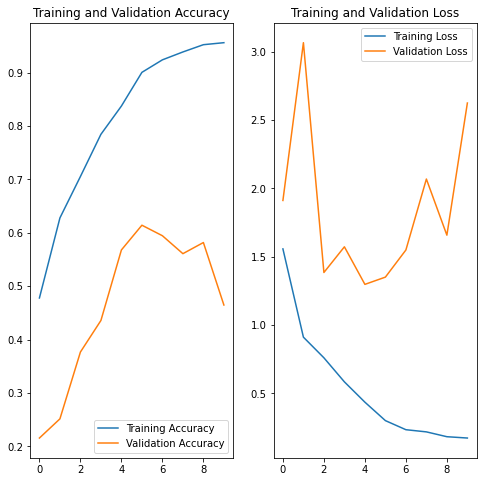

In [6]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


##### **Checking Images - Train dataset**

(32, 160, 160, 3)
(32,)


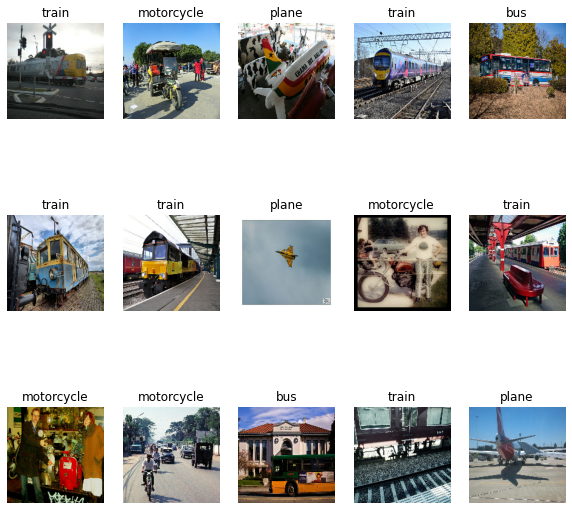

In [7]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(15):
    ax = plt.subplot(3, 5, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

### **5.0 Model Data Augmentation**

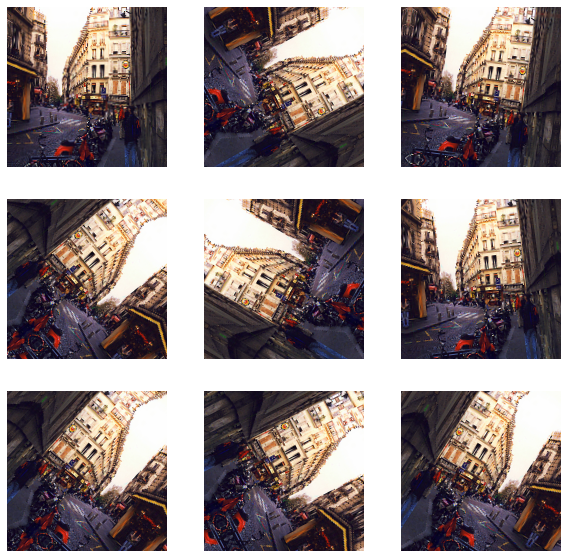

In [8]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
])

for image, _ in train_ds.take(1):
  plt.figure(figsize=(10, 10))
  first_image = image[0]
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255)
    plt.axis('off')

### **6.0  Post - Augmentation Modeling**

#### **6.1  Model Training**

In [9]:
epochs=10
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

Epoch 1/10
108/108 [==============================] - 48s 441ms/step - loss: 0.1298 - accuracy: 0.9598 - val_loss: 1.6570 - val_accuracy: 0.6153
Epoch 2/10
108/108 [==============================] - 45s 417ms/step - loss: 0.1151 - accuracy: 0.9693 - val_loss: 1.6606 - val_accuracy: 0.6165
Epoch 3/10
108/108 [==============================] - 45s 415ms/step - loss: 0.1202 - accuracy: 0.9632 - val_loss: 2.1032 - val_accuracy: 0.5817
Epoch 4/10
108/108 [==============================] - 43s 401ms/step - loss: 0.1194 - accuracy: 0.9641 - val_loss: 1.8181 - val_accuracy: 0.6095
Epoch 5/10
108/108 [==============================] - 44s 412ms/step - loss: 0.1101 - accuracy: 0.9687 - val_loss: 1.5841 - val_accuracy: 0.6025
Epoch 6/10
108/108 [==============================] - 47s 440ms/step - loss: 0.0801 - accuracy: 0.9722 - val_loss: 1.7202 - val_accuracy: 0.6025
Epoch 7/10
108/108 [==============================] - 48s 441ms/step - loss: 0.1054 - accuracy: 0.9647 - val_loss: 2.3070 - val_ac

#### **6.2  Accuracy and Loss Plot**

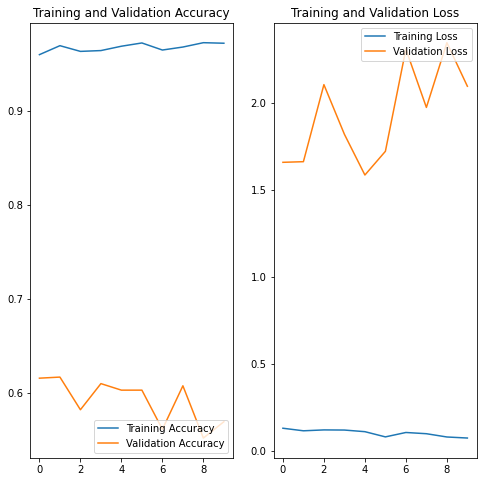

In [10]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


#### **Checking Images**

(32, 160, 160, 3)
(32,)


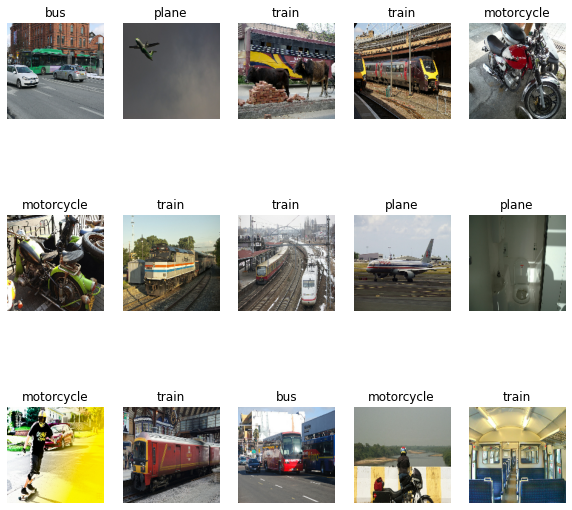

In [11]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(15):
    ax = plt.subplot(3, 5, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

### **7.0  Model Testing**

#### **7.1  Loading the test dataset**

In [12]:
test_ds = tf.keras.utils.image_dataset_from_directory(test_dir,
                                                      shuffle=True,
                                                      image_size=(img_height, img_width),
                                                      batch_size=batch_size,
                                                      seed=1234)
class_names = test_ds.class_names
class_names

Found 20 files belonging to 4 classes.


['bus', 'motorcycle', 'plane', 'train']

In [13]:
loss, accuracy = model.evaluate(test_ds)
print('Test accuracy :', accuracy)

1/1 [==============================] - 2s 2s/step - loss: 2.4527 - accuracy: 0.6500
Test accuracy : 0.6499999761581421


#### **7.2  Tf-explain visualization**

In [14]:
## Plotting the original image, grad-cam, and prediction
from tf_explain.core.grad_cam import GradCAM
import glob
import cv2

def process(contentpath):
    """This function read images in file path"""
    jpg_images = glob.glob(contentpath + '/*.jpg')
    return jpg_images

def load_print_GRADCAM(imgpath):
    """This function generates image and gradcam visual"""
    imga = cv2.resize((cv2.imread(imgpath)), (160, 160))
    
    img = tf.keras.preprocessing.image.load_img(imgpath, target_size=(160, 160))
    img = tf.keras.preprocessing.image.img_to_array(img)
    data = ([img], None)
    explainer = GradCAM()
    grid = explainer.explain(data, model, class_index=2)  # 281 is the tabby cat index in ImageNet

    explainer.save(grid, ".", "grad_cam.png")

    plt.figure(figsize=(10, 5))
    ax = plt.subplot(1, 2, 1)
    #plt.imshow(cv2.imread(im))
    plt.imshow(cv2.cvtColor(imga, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    #plt.title(str(round(100*pct_cat, 0))+'%' + ' Cat')
    ax = plt.subplot(1, 2, 2)
    im = cv2.imread('grad_cam.png');
    plt.imshow(im)
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    return 

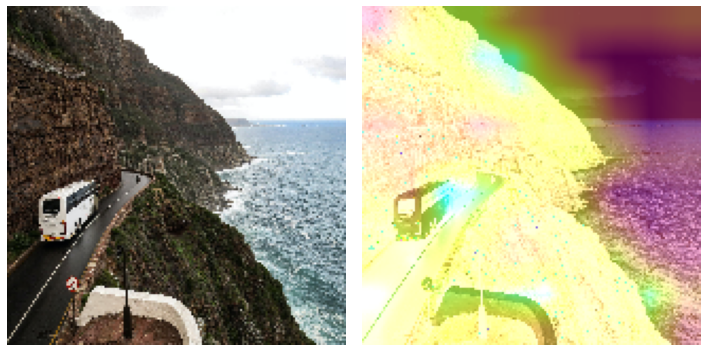

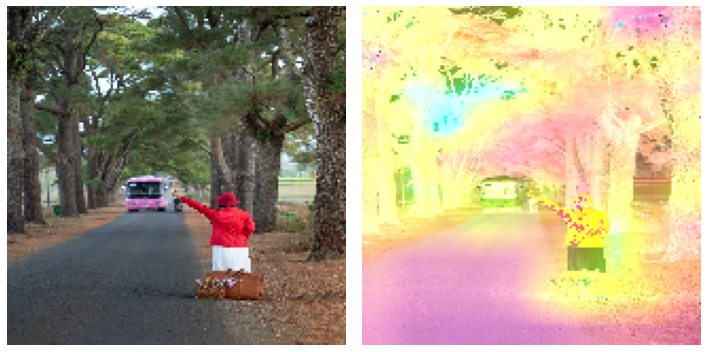

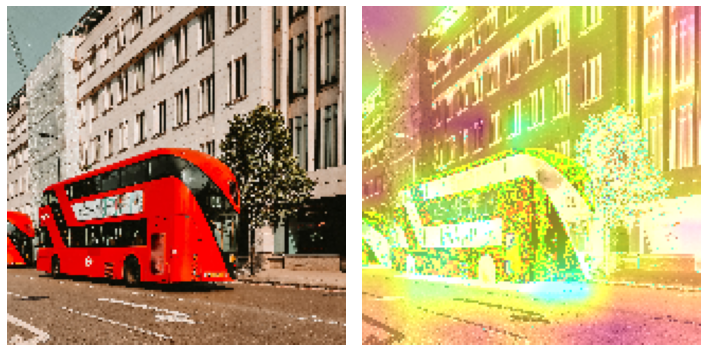

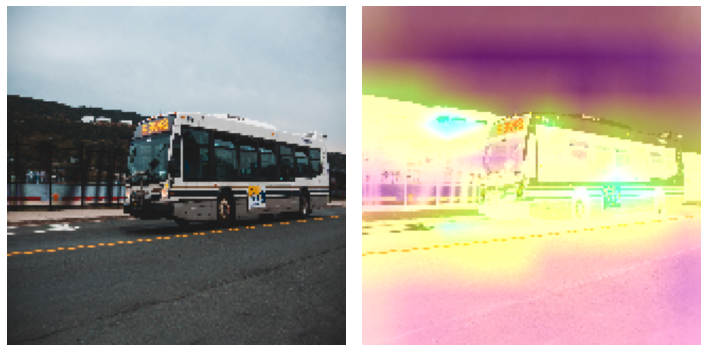

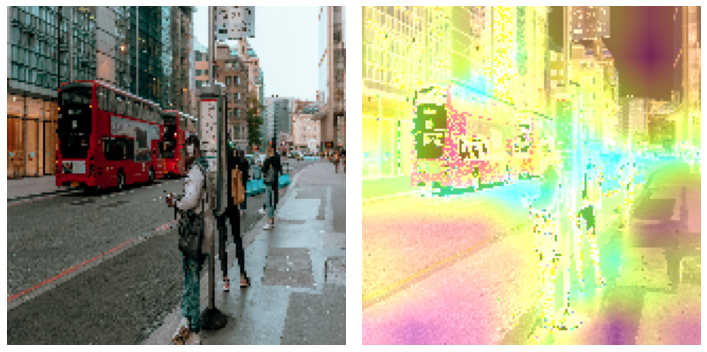

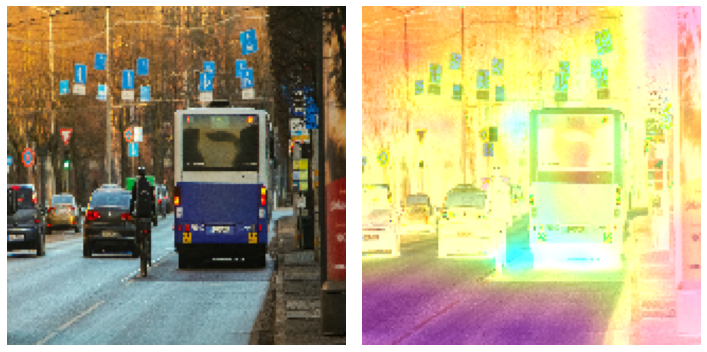

In [15]:
image_list = process(r'test_vehicle/bus/')
for x in image_list:
    load_print_GRADCAM(x)

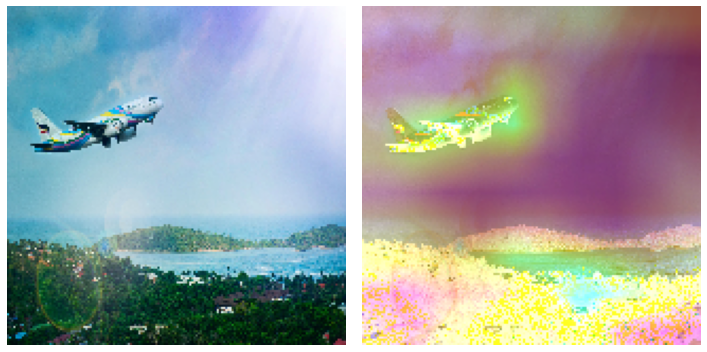

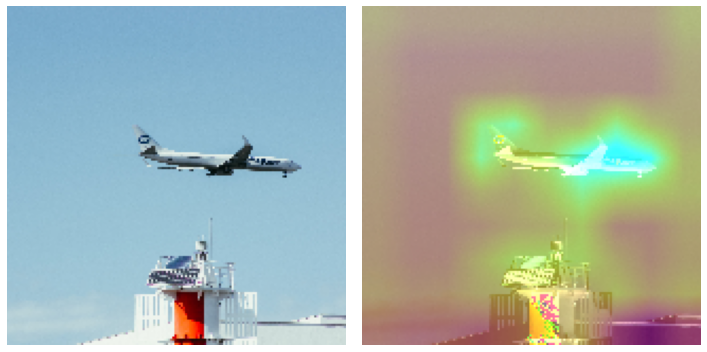

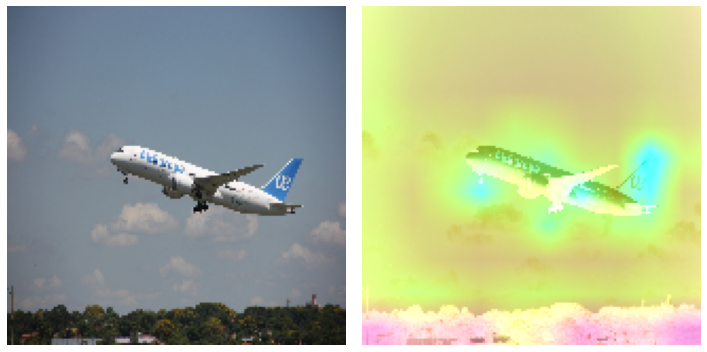

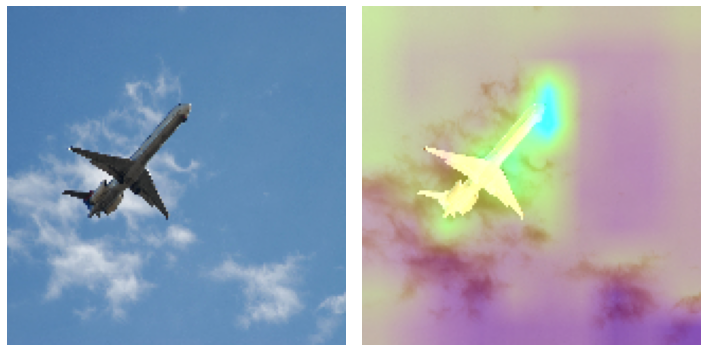

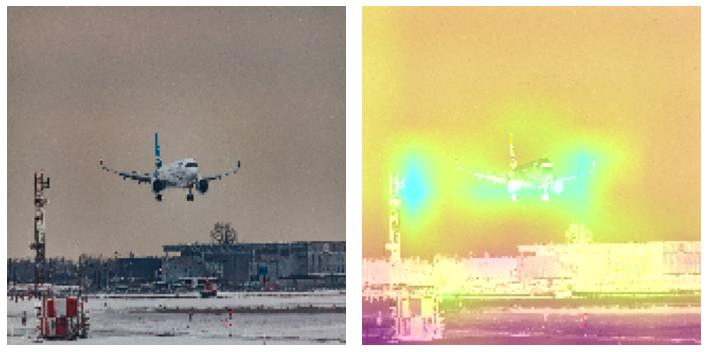

In [16]:
image_list = process(r'test_vehicle/plane/')
for x in image_list:
    load_print_GRADCAM(x)

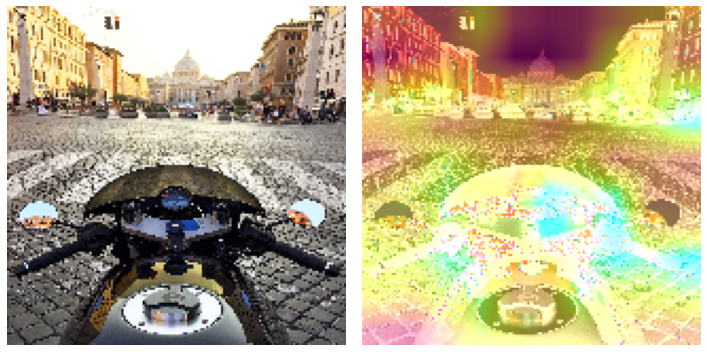

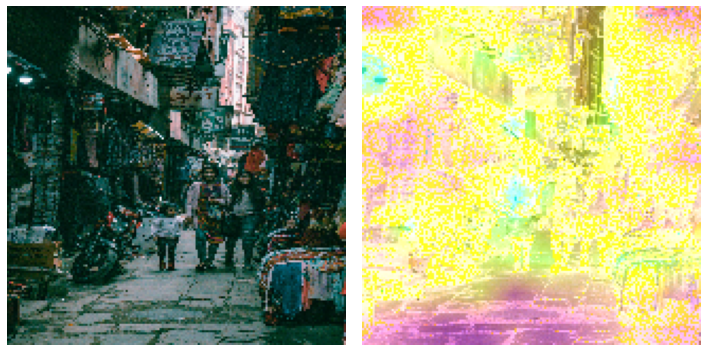

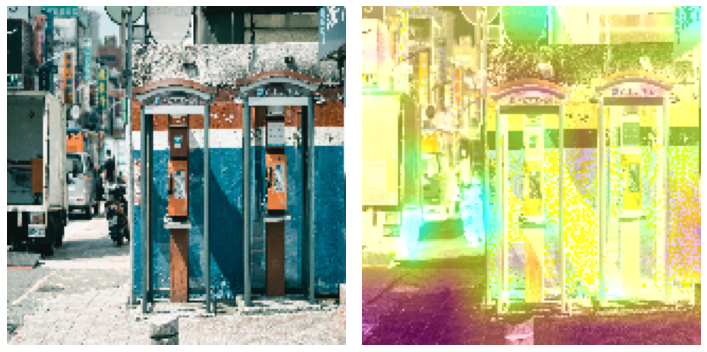

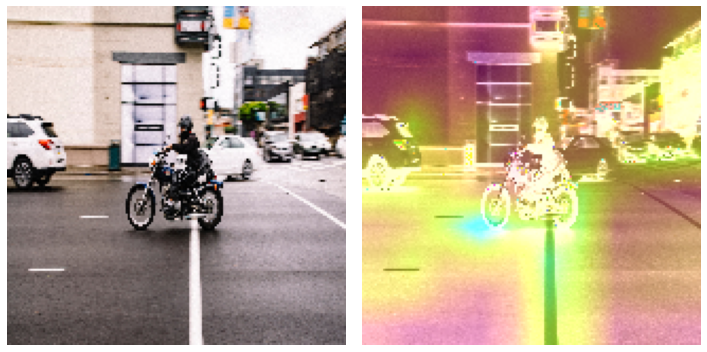

In [17]:
image_list = process(r'test_vehicle/motorcycle/')
for x in image_list:
    load_print_GRADCAM(x)

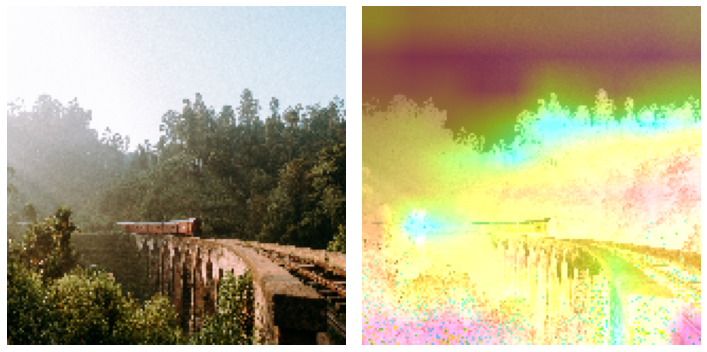

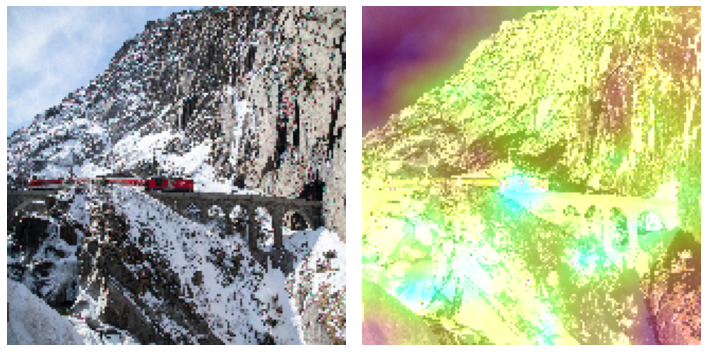

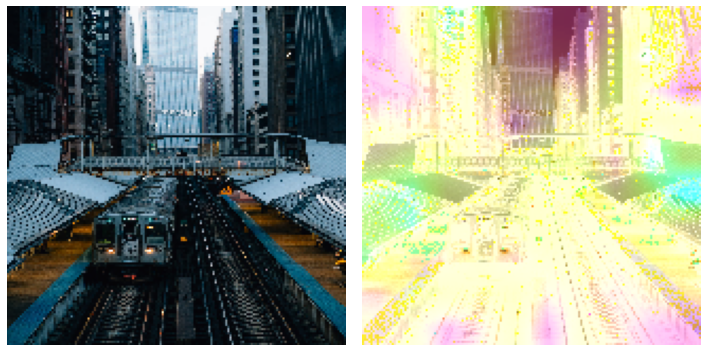

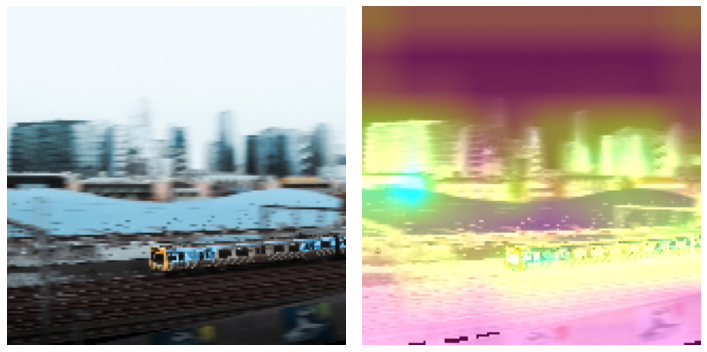

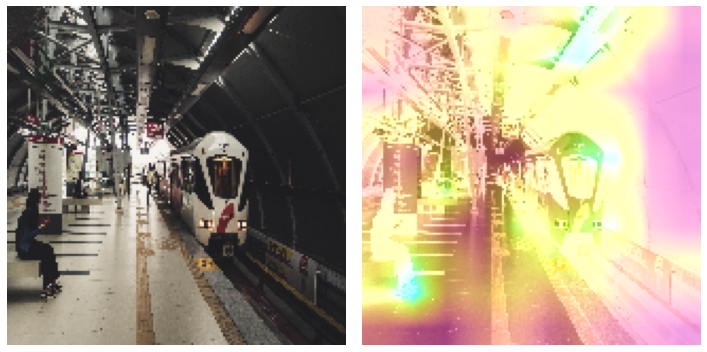

In [18]:
image_list = process(r'test_vehicle/train/')
for x in image_list:
    load_print_GRADCAM(x)

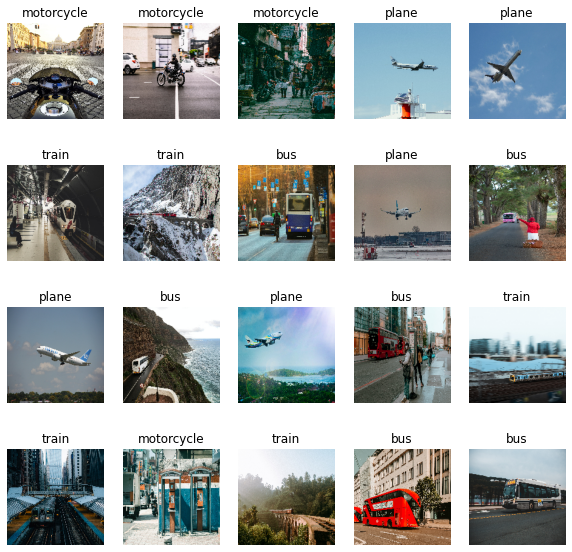

In [19]:
#Showing the test image

plt.figure(figsize=(10, 10))
for images, labels in test_ds.take(1):
  for i in range(20):
    ax = plt.subplot(4, 5, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")


In [20]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

In [21]:
x_test, y_test = test_ds.map(lambda x, y: (preprocess_input(x), y)).as_numpy_iterator().next()

x_test.shape, y_test.shape

((20, 160, 160, 3), (20,))

In [22]:
loss, accuracy = model.evaluate(x_test, y_test)
loss, accuracy

predictions = model.predict(x_test)

1/1 [==============================] - 0s 94ms/step - loss: 3.3589 - accuracy: 0.2500


In [1]:
plt.figure(figsize=(15, 15))
for images,labels in test_ds.take(1):
    for i in range(20):
        ax = plt.subplot(4, 5, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        color='blue'
        if labels[i] != predictions.argmax(1)[i]:
            color='red'
        plt.title(f"Act: {class_names[labels[i]][:7]} | {class_names[predictions.argmax(1)[i]][:4]}", color=color)
        plt.axis("off")
plt.show()

NameError: name 'plt' is not defined

In [24]:
from tf_explain.core.grad_cam import GradCAM

imag = (x_test, None)

# Start explainer
explainer = GradCAM()
grid = explainer.explain(imag, model, class_index=0)

explainer.save(grid, ".", "grad_cam.png")

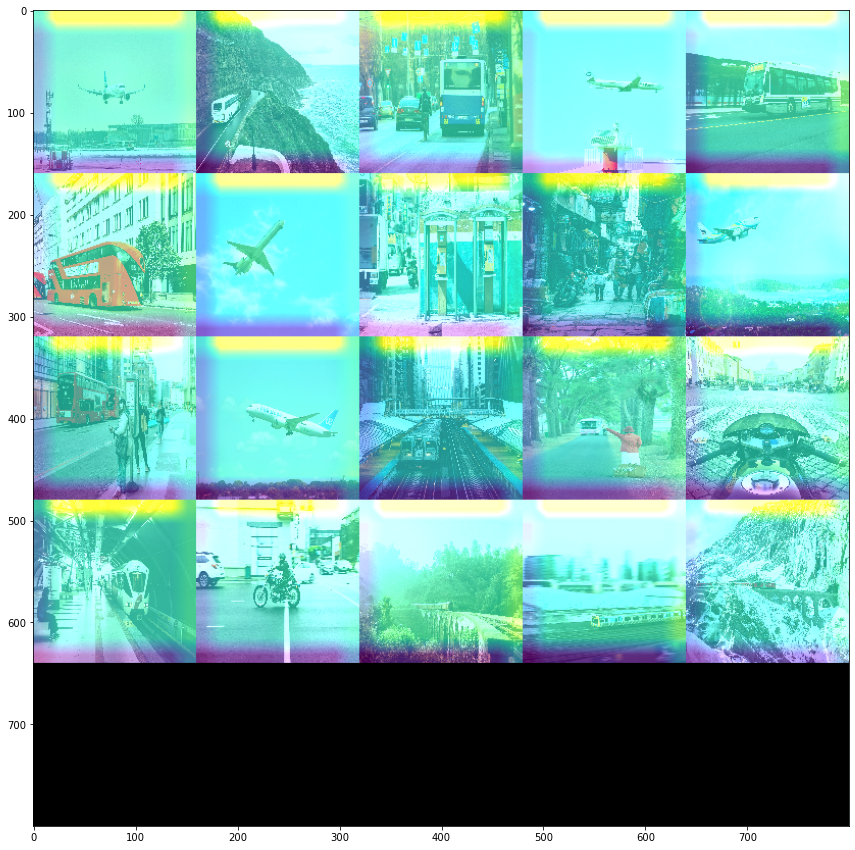

In [25]:
plt.figure(figsize=(15,15))
plt.imshow(grid.astype("uint8"))
plt.show()

### **8.0  Transfer learning**

#### **8.1 Parameters definition**

In [26]:
BATCH_SIZE = 32
IMG_SIZE = (160, 160)
IMG_SHAPE = IMG_SIZE + (3,)

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=IMG_SIZE,
  batch_size=BATCH_SIZE)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=IMG_SIZE,
  batch_size=BATCH_SIZE)

test_ds = tf.keras.utils.image_dataset_from_directory(test_dir,
                                                      shuffle=True,
                                                      image_size=IMG_SIZE,
                                                      batch_size=BATCH_SIZE)



Found 4318 files belonging to 4 classes.
Using 3455 files for training.
Found 4318 files belonging to 4 classes.
Using 863 files for validation.
Found 20 files belonging to 4 classes.


#### **8.2 Autotunning and Augmentation**

In [27]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
#test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2),
])

#### **8.3  Pretrained model - ImageNet**

In [28]:
# Creat the base model from the pre-trained model MobileNet V2

base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE, 
                                               include_top=False, 
                                               weights='imagenet')
image_batch, label_batch = next(iter(train_ds))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(32, 5, 5, 1280)


In [29]:
base_model.trainable = False
base_model.summary()

global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

prediction_layer = tf.keras.layers.Dense(4)
#adjust dense with respect to the classes
prediction_batch=prediction_layer(feature_batch_average)
print(prediction_batch.shape)

Model: "mobilenetv2_1.00_160"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 80, 80, 32)   864         ['input_1[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 80, 80, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 80, 80, 32)   0           ['bn_Conv1[0][

#### **8.4  Creating  model**

In [30]:
inputs = tf.keras.Input(shape=(160, 160, 3))
x = data_augmentation (inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate), 
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), 
              metrics=['accuracy'])

model.summary()

Model: "model_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 sequential_2 (Sequential)   (None, 160, 160, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 160, 160, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 160, 160, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_160 (Funct  (None, 5, 5, 1280)       2257984   
 ional)                                                          
                                                          

In [31]:
len(model.trainable_variables)

initial_epochs = 10

loss0, accuracy0 = model.evaluate(val_ds)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

history = model.fit(train_ds,
                    epochs=initial_epochs, 
                    validation_data=val_ds)

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

27/27 [==============================] - 12s 369ms/step - loss: 1.9217 - accuracy: 0.2190
initial loss: 1.92
initial accuracy: 0.22
Epoch 1/10
108/108 [==============================] - 43s 372ms/step - loss: 1.6215 - accuracy: 0.3323 - val_loss: 1.1250 - val_accuracy: 0.5458
Epoch 2/10
108/108 [==============================] - 41s 376ms/step - loss: 1.1922 - accuracy: 0.5164 - val_loss: 0.8553 - val_accuracy: 0.7022
Epoch 3/10
108/108 [==============================] - 41s 384ms/step - loss: 0.9838 - accuracy: 0.6223 - val_loss: 0.7263 - val_accuracy: 0.7543
Epoch 4/10
108/108 [==============================] - 41s 384ms/step - loss: 0.8958 - accuracy: 0.6564 - val_loss: 0.6549 - val_accuracy: 0.7787
Epoch 5/10
108/108 [==============================] - 40s 374ms/step - loss: 0.8033 - accuracy: 0.6920 - val_loss: 0.6109 - val_accuracy: 0.7891
Epoch 6/10
108/108 [==============================] - 41s 381ms/step - loss: 0.7847 - accuracy: 0.6923 - val_loss: 0.5833 - val_accuracy: 0.797

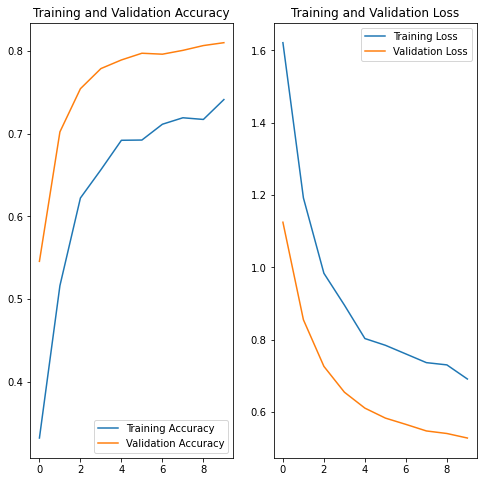

In [32]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


#### **8.5 Fine-tuning our model weights from a pre-trained model**

In [33]:
base_model.trainable = True
base_model. summary()

# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model. layers))

# Fine-tune from this layer onwards
fine_tune_at = 100

# Freeze all the layers before the `fine_tune_at" layer
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = True #was False

Model: "mobilenetv2_1.00_160"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 80, 80, 32)   864         ['input_1[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 80, 80, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 80, 80, 32)   0           ['bn_Conv1[0][

In [34]:
base_learning_rate=0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate/10),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model.summary()

Model: "model_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 sequential_2 (Sequential)   (None, 160, 160, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 160, 160, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 160, 160, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_160 (Funct  (None, 5, 5, 1280)       2257984   
 ional)                                                          
                                                          

In [35]:
len(model.trainable_variables)

158

In [36]:
initial_epochs= 10
fine_tune_epochs = 10
total_epochs = initial_epochs + fine_tune_epochs
history_fine = model.fit(train_ds,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=val_ds)

Epoch 10/20
108/108 [==============================] - 136s 1s/step - loss: 0.6650 - accuracy: 0.7424 - val_loss: 0.5218 - val_accuracy: 0.8123
Epoch 11/20
108/108 [==============================] - 125s 1s/step - loss: 0.5893 - accuracy: 0.7737 - val_loss: 0.4906 - val_accuracy: 0.8192
Epoch 12/20
108/108 [==============================] - 125s 1s/step - loss: 0.5463 - accuracy: 0.7858 - val_loss: 0.4766 - val_accuracy: 0.8204
Epoch 13/20
108/108 [==============================] - 123s 1s/step - loss: 0.5049 - accuracy: 0.8101 - val_loss: 0.4740 - val_accuracy: 0.8192
Epoch 14/20
108/108 [==============================] - 122s 1s/step - loss: 0.5011 - accuracy: 0.7994 - val_loss: 0.4702 - val_accuracy: 0.8227
Epoch 15/20
108/108 [==============================] - 123s 1s/step - loss: 0.4860 - accuracy: 0.8188 - val_loss: 0.4693 - val_accuracy: 0.8204
Epoch 16/20
108/108 [==============================] - 134s 1s/step - loss: 0.4656 - accuracy: 0.8258 - val_loss: 0.4857 - val_accuracy:

In [37]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine. history['val_loss']

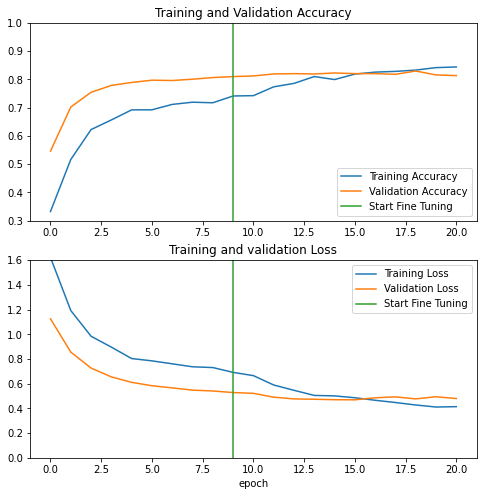

In [38]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.3, 1])
plt.plot([initial_epochs-1, initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.6])
plt.plot([initial_epochs-1, initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend (loc='upper right')
plt.title('Training and validation Loss')
plt.xlabel('epoch')
plt.show()

#loss, accuracy = model.evaluate(test_dataset)
#print('Test accuracy :', accuracy)


#### **8.6  Pre-trained Model Testing**

#### **8.6.1  Loading the test dataset**

In [39]:
test_ds = tf.keras.utils.image_dataset_from_directory(test_dir,
                                                      shuffle=True,
                                                      image_size=(img_height, img_width),
                                                      batch_size=batch_size,
                                                      seed=1234)

Found 20 files belonging to 4 classes.


In [40]:
loss, accuracy = model.evaluate(test_ds)
print('Test accuracy :', accuracy)

1/1 [==============================] - 2s 2s/step - loss: 0.6661 - accuracy: 0.8000
Test accuracy : 0.800000011920929


#### **8.7  Tf-explain visualization**

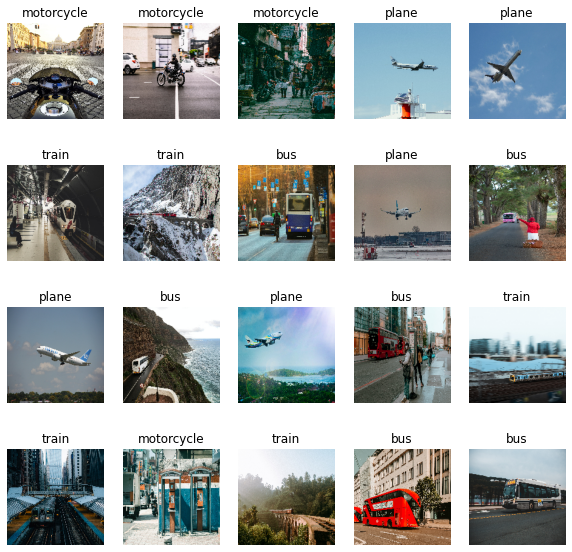

In [41]:
#Showing the test image

plt.figure(figsize=(10, 10))
for images, labels in test_ds.take(1):
  for i in range(20):
    ax = plt.subplot(4, 5, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")


In [42]:
x_test, y_test = test_ds.map(lambda x, y: (preprocess_input(x), y)).as_numpy_iterator().next()

x_test.shape, y_test.shape

((20, 160, 160, 3), (20,))

In [43]:
loss, accuracy = model.evaluate(x_test, y_test)
loss, accuracy

predictions = model.predict(x_test)

1/1 [==============================] - 0s 210ms/step - loss: 2.8704 - accuracy: 0.2500


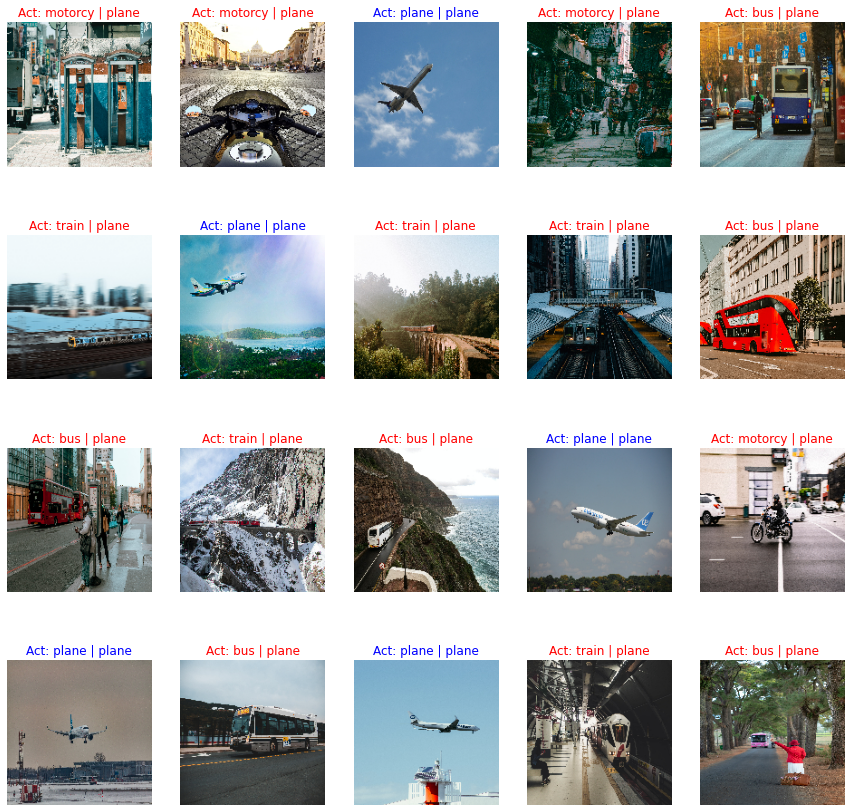

In [44]:
plt.figure(figsize=(15, 15))
for images,labels in test_ds.take(1):
    for i in range(20):
        ax = plt.subplot(4, 5, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        color='blue'
        if labels[i] != predictions.argmax(1)[i]:
            color='red'
        plt.title(f"Act: {class_names[labels[i]][:7]} | {class_names[predictions.argmax(1)[i]][:7]}", color=color)
        plt.axis("off")
plt.show()

In [45]:
from tf_explain.core.grad_cam import GradCAM

imag = (x_test, None)

# Start explainer
explainer = GradCAM()
grid = explainer.explain(imag, base_model, class_index=0)

explainer.save(grid, ".", "grad_cam.png")

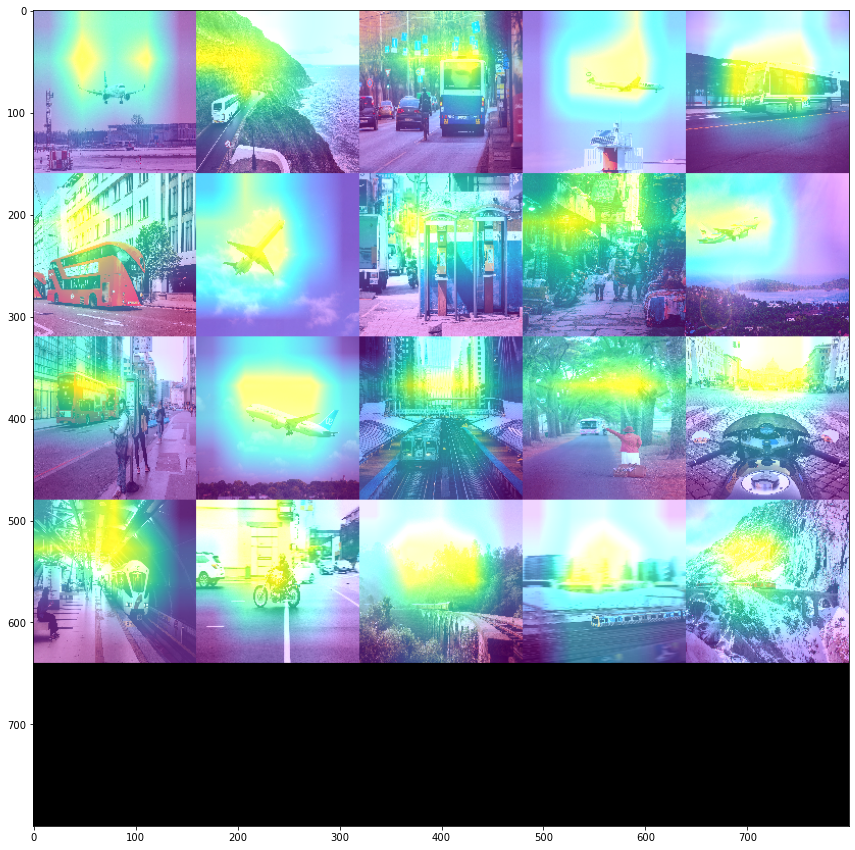

In [46]:
plt.figure(figsize=(15,15))
plt.imshow(grid.astype("uint8"))
plt.show()

## **Comparing Two different networks**

### Network layering

#### Network 1 layering

In [47]:
model1 = Sequential([
    layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
    
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(pool_size=(2, 2), padding='same'),    
    layers.BatchNormalization(),
    
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(pool_size=(2, 2), padding='same'),    
    layers.BatchNormalization(),
    
    layers.Conv2D(64, 3, padding='same', activation='relu'),  
    layers.MaxPooling2D(pool_size=(2, 2), padding='same'),    
    layers.BatchNormalization(),

    layers.Conv2D(128, 3, padding='same', activation='relu'),  
    layers.MaxPooling2D(pool_size=(2, 2), padding='valid'),    
    layers.BatchNormalization(),
  
    layers.Flatten(),
    
    layers.Dense(128, activation='relu'),
    
    layers.Dense(num_classes),
])

model1.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model1.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 160, 160, 3)       0         
                                                                 
 conv2d_4 (Conv2D)           (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 80, 80, 16)       0         
 2D)                                                             
                                                                 
 batch_normalization_4 (Batc  (None, 80, 80, 16)       64        
 hNormalization)                                                 
                                                                 
 conv2d_5 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 40, 40, 32)      

#### Network 2 layering

In [48]:
model2 = Sequential([
    layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
    
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(pool_size=(2, 2), padding='same'),    
    layers.BatchNormalization(),
    
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(pool_size=(2, 2), padding='same'),    
    layers.BatchNormalization(),
    
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(pool_size=(2, 2), padding='same'),    
    layers.BatchNormalization(),
    
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(pool_size=(2, 2), padding='same'),    
    layers.BatchNormalization(),
    
    layers.Conv2D(64, 3, padding='same', activation='relu'),  
    layers.MaxPooling2D(pool_size=(2, 2), padding='same'),    
    layers.BatchNormalization(),

    layers.Conv2D(128, 3, padding='same', activation='relu'),  
    layers.MaxPooling2D(pool_size=(2, 2), padding='valid'),    
    layers.BatchNormalization(),
  
    layers.Flatten(),
    
    layers.Dense(128, activation='relu'),
    
    layers.Dense(num_classes),
])

model2.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model2.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_3 (Rescaling)     (None, 160, 160, 3)       0         
                                                                 
 conv2d_8 (Conv2D)           (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 80, 80, 16)       0         
 2D)                                                             
                                                                 
 batch_normalization_8 (Batc  (None, 80, 80, 16)       64        
 hNormalization)                                                 
                                                                 
 conv2d_9 (Conv2D)           (None, 80, 80, 16)        2320      
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 40, 40, 16)      

### **Model Training**

#### Model 1

In [49]:
epochs=10
history1 = model1.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

acc = history1.history['accuracy']
val_acc = history1.history['val_accuracy']

loss = history1.history['loss']
val_loss = history1.history['val_loss']

epochs_range = range(epochs)

Epoch 1/10
108/108 [==============================] - 38s 346ms/step - loss: 1.4784 - accuracy: 0.4877 - val_loss: 2.6064 - val_accuracy: 0.3210
Epoch 2/10
108/108 [==============================] - 38s 352ms/step - loss: 0.8987 - accuracy: 0.6428 - val_loss: 4.3778 - val_accuracy: 0.2966
Epoch 3/10
108/108 [==============================] - 42s 387ms/step - loss: 0.7455 - accuracy: 0.7088 - val_loss: 2.0819 - val_accuracy: 0.4565
Epoch 4/10
108/108 [==============================] - 40s 374ms/step - loss: 0.5748 - accuracy: 0.7797 - val_loss: 1.3117 - val_accuracy: 0.5180
Epoch 5/10
108/108 [==============================] - 41s 376ms/step - loss: 0.4380 - accuracy: 0.8397 - val_loss: 1.2994 - val_accuracy: 0.5330
Epoch 6/10
108/108 [==============================] - 40s 375ms/step - loss: 0.3634 - accuracy: 0.8706 - val_loss: 1.2548 - val_accuracy: 0.6222
Epoch 7/10
108/108 [==============================] - 40s 373ms/step - loss: 0.2746 - accuracy: 0.9114 - val_loss: 1.4829 - val_ac

#### Model 2

In [50]:
epochs=10
history2 = model2.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

acc2 = history2.history['accuracy']
val_acc2 = history2.history['val_accuracy']

loss2 = history2.history['loss']
val_loss2 = history2.history['val_loss']

epochs_range = range(epochs)

Epoch 1/10
108/108 [==============================] - 29s 260ms/step - loss: 1.1838 - accuracy: 0.5129 - val_loss: 1.8325 - val_accuracy: 0.2155
Epoch 2/10
108/108 [==============================] - 31s 283ms/step - loss: 0.8839 - accuracy: 0.6350 - val_loss: 2.3512 - val_accuracy: 0.2155
Epoch 3/10
108/108 [==============================] - 29s 269ms/step - loss: 0.6966 - accuracy: 0.7302 - val_loss: 1.1593 - val_accuracy: 0.4867
Epoch 4/10
108/108 [==============================] - 31s 287ms/step - loss: 0.5268 - accuracy: 0.8055 - val_loss: 1.0646 - val_accuracy: 0.5550
Epoch 5/10
108/108 [==============================] - 30s 282ms/step - loss: 0.3689 - accuracy: 0.8747 - val_loss: 1.1006 - val_accuracy: 0.5852
Epoch 6/10
108/108 [==============================] - 28s 259ms/step - loss: 0.2700 - accuracy: 0.9169 - val_loss: 1.7153 - val_accuracy: 0.5481
Epoch 7/10
108/108 [==============================] - 29s 265ms/step - loss: 0.2333 - accuracy: 0.9323 - val_loss: 1.4944 - val_ac

### **Accuracy and Loss Plot**

#### Plot for Model1 

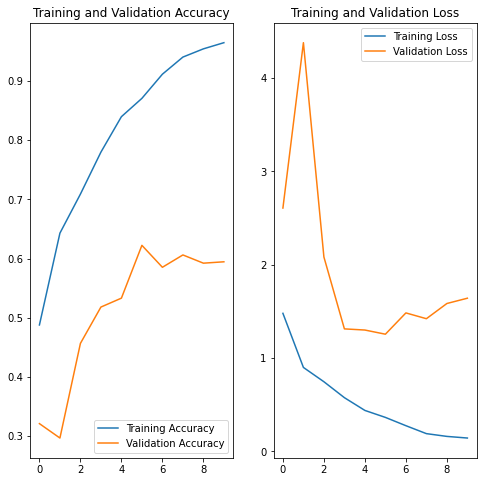

In [51]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


#### Plot for Model2

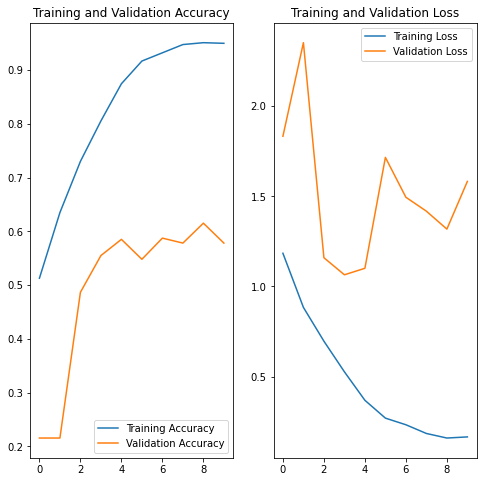

In [52]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc2, label='Training Accuracy')
plt.plot(epochs_range, val_acc2, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss2, label='Training Loss')
plt.plot(epochs_range, val_loss2, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


## **Comparing Two different pooling mechanism**

#### Model 1 - Max pooling

In [59]:
model3 = Sequential([
    layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
    
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(pool_size=(2, 2), padding='same'),    
    
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(pool_size=(2, 2), padding='same'),    
  
    layers.Conv2D(64, 3, padding='same', activation='relu'),  
    layers.MaxPooling2D(pool_size=(2, 2), padding='same'),    

    layers.Conv2D(128, 3, padding='same', activation='relu'),  
    layers.MaxPooling2D(pool_size=(2, 2), padding='valid'),    
    layers.BatchNormalization(),
  
    layers.Flatten(),
    
    layers.Dense(128, activation='relu'),
    
    layers.Dense(num_classes),
])

model3.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model3.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_6 (Rescaling)     (None, 160, 160, 3)       0         
                                                                 
 conv2d_22 (Conv2D)          (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 80, 80, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_23 (Conv2D)          (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 40, 40, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_24 (Conv2D)          (None, 40, 40, 64)       

In [60]:
epochs=10
history3 = model3.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

acc3 = history3.history['accuracy']
val_acc3 = history3.history['val_accuracy']

loss3 = history3.history['loss']
val_loss3 = history3.history['val_loss']

epochs_range = range(epochs)

Epoch 1/10
108/108 [==============================] - 47s 420ms/step - loss: 1.1572 - accuracy: 0.5236 - val_loss: 1.3268 - val_accuracy: 0.4565
Epoch 2/10
108/108 [==============================] - 40s 373ms/step - loss: 0.9252 - accuracy: 0.6263 - val_loss: 1.3058 - val_accuracy: 0.3638
Epoch 3/10
108/108 [==============================] - 41s 382ms/step - loss: 0.7897 - accuracy: 0.6808 - val_loss: 1.2028 - val_accuracy: 0.5469
Epoch 4/10
108/108 [==============================] - 46s 428ms/step - loss: 0.6334 - accuracy: 0.7522 - val_loss: 1.0684 - val_accuracy: 0.5666
Epoch 5/10
108/108 [==============================] - 46s 421ms/step - loss: 0.4415 - accuracy: 0.8399 - val_loss: 1.0208 - val_accuracy: 0.5805
Epoch 6/10
108/108 [==============================] - 42s 390ms/step - loss: 0.3315 - accuracy: 0.8828 - val_loss: 1.4768 - val_accuracy: 0.5180
Epoch 7/10
108/108 [==============================] - 37s 341ms/step - loss: 0.2262 - accuracy: 0.9366 - val_loss: 1.6312 - val_ac

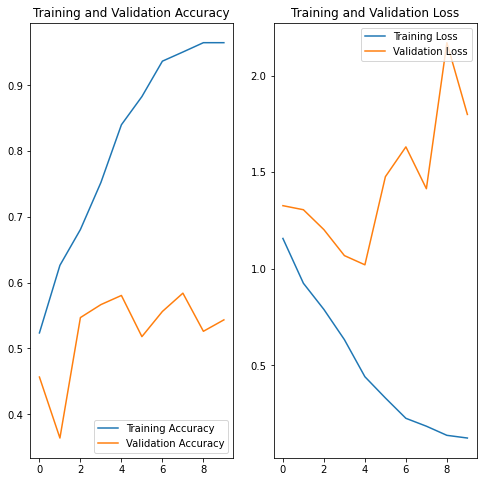

In [61]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc3, label='Training Accuracy')
plt.plot(epochs_range, val_acc3, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss3, label='Training Loss')
plt.plot(epochs_range, val_loss3, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


In [62]:
loss, accuracy = model3.evaluate(test_ds)
print('Test accuracy :', accuracy)

1/1 [==============================] - 2s 2s/step - loss: 2.2232 - accuracy: 0.5500
Test accuracy : 0.550000011920929


#### Model 2 - Average pooling

In [63]:
model4 = Sequential([
    layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
    
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.AveragePooling2D(pool_size=(2, 2), padding='same'),    
    
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.AveragePooling2D(pool_size=(2, 2), padding='same'),    
    
    layers.Conv2D(64, 3, padding='same', activation='relu'),  
    layers.AveragePooling2D(pool_size=(2, 2), padding='same'),    

    layers.Conv2D(128, 3, padding='same', activation='relu'),  
    layers.AveragePooling2D(pool_size=(2, 2), padding='valid'),    
    layers.BatchNormalization(),
  
    layers.Flatten(),
    
    layers.Dense(128, activation='relu'),
    
    layers.Dense(num_classes),
])

model4.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model4.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_7 (Rescaling)     (None, 160, 160, 3)       0         
                                                                 
 conv2d_26 (Conv2D)          (None, 160, 160, 16)      448       
                                                                 
 average_pooling2d_4 (Averag  (None, 80, 80, 16)       0         
 ePooling2D)                                                     
                                                                 
 conv2d_27 (Conv2D)          (None, 80, 80, 32)        4640      
                                                                 
 average_pooling2d_5 (Averag  (None, 40, 40, 32)       0         
 ePooling2D)                                                     
                                                                 
 conv2d_28 (Conv2D)          (None, 40, 40, 64)       

In [64]:
epochs=10
history4 = model4.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

acc4 = history4.history['accuracy']
val_acc4 = history4.history['val_accuracy']

loss4 = history4.history['loss']
val_loss4 = history4.history['val_loss']

epochs_range = range(epochs)

Epoch 1/10
108/108 [==============================] - 34s 300ms/step - loss: 1.1182 - accuracy: 0.5088 - val_loss: 1.3315 - val_accuracy: 0.3534
Epoch 2/10
108/108 [==============================] - 36s 330ms/step - loss: 0.9803 - accuracy: 0.5991 - val_loss: 1.3228 - val_accuracy: 0.3812
Epoch 3/10
108/108 [==============================] - 45s 419ms/step - loss: 0.8760 - accuracy: 0.6495 - val_loss: 1.2910 - val_accuracy: 0.5689
Epoch 4/10
108/108 [==============================] - 44s 404ms/step - loss: 0.7821 - accuracy: 0.6828 - val_loss: 1.1278 - val_accuracy: 0.5295
Epoch 5/10
108/108 [==============================] - 41s 375ms/step - loss: 0.6876 - accuracy: 0.7366 - val_loss: 1.0456 - val_accuracy: 0.5272
Epoch 6/10
108/108 [==============================] - 36s 334ms/step - loss: 0.5461 - accuracy: 0.7847 - val_loss: 1.2708 - val_accuracy: 0.5295
Epoch 7/10
108/108 [==============================] - 39s 363ms/step - loss: 0.4074 - accuracy: 0.8541 - val_loss: 1.3267 - val_ac

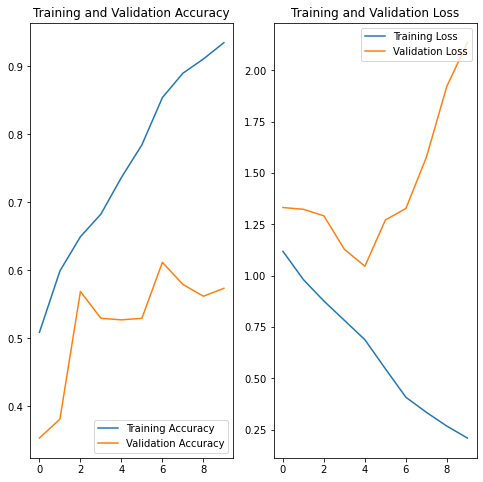

In [65]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc4, label='Training Accuracy')
plt.plot(epochs_range, val_acc4, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss4, label='Training Loss')
plt.plot(epochs_range, val_loss4, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


In [66]:
loss, accuracy = model4.evaluate(test_ds)
print('Test accuracy :', accuracy)

1/1 [==============================] - 2s 2s/step - loss: 2.9582 - accuracy: 0.6000
Test accuracy : 0.6000000238418579
